# GrabCut
Link for code, report and images: https://drive.google.com/open?id=1nGcrMaKT3P8vp91tgiqyHBPp3VFpQh2h

In [1]:
import numpy as np
from sklearn.cluster import KMeans
import sys
import glob
import cv2 as cv
import igraph as ig
from matplotlib import pyplot as plt

## Code for Gaussian mixture

In [2]:
class GaussianMixture:
    def __init__(self, X, n_components):
        self.n_components = n_components
        self.n_features = X.shape[1]
        self.n_samples = np.zeros(self.n_components)

        self.coefs = np.zeros(self.n_components)
        self.means = np.zeros((self.n_components, self.n_features))
       
        self.covariances = np.zeros((self.n_components, self.n_features, self.n_features))
        self.init_with_kmeans(X)

    def init_with_kmeans(self, X):
        label = KMeans(n_clusters=self.n_components, n_init=1).fit(X).labels_
        self.fit(X, label)

    def calc_score(self, X, ci):
        score = np.zeros(X.shape[0])
        
        if self.coefs[ci] > 0:
            diff = X - self.means[ci]
            mult = np.einsum('ij,ij->i', diff, np.dot(np.linalg.inv(self.covariances[ci]), diff.T).T)
            score = np.exp(-.5 * mult) / np.sqrt(2 * np.pi) / np.sqrt(np.linalg.det(self.covariances[ci]))
        
        return score

    def calc_prob(self, X):
        prob = [self.calc_score(X, ci) for ci in range(self.n_components)]
        
        return np.dot(self.coefs, prob)

    def which_component(self, X):
        prob = np.array([self.calc_score(X, ci) for ci in range(self.n_components)]).T

        return np.argmax(prob, axis=1)

    def fit(self, X, labels):
        assert self.n_features == X.shape[1]

        self.n_samples[:] = 0
        self.coefs[:] = 0

        uni_labels, count = np.unique(labels, return_counts=True)
        self.n_samples[uni_labels] = count

        variance = 0.01
        for ci in uni_labels:
            n = self.n_samples[ci]

            self.coefs[ci] = n / np.sum(self.n_samples)
            self.means[ci] = np.mean(X[ci == labels], axis=0)
            self.covariances[ci] = 0 if self.n_samples[ci] <= 1 else np.cov(X[ci == labels].T)

            det = np.linalg.det(self.covariances[ci])
            if det <= 0:
                self.covariances[ci] += np.eye(self.n_features) * variance
                det = np.linalg.det(self.covariances[ci])

## Defining variables and flags

In [3]:
BLUE = [255, 0, 0]        
DRAW_BG = { 'val': 0}
DRAW_FG = { 'val': 1}
DRAW_PR_FG = {'val': 3}
DRAW_PR_BG = {'val': 2}

In [4]:
# setting up flags
rect = (0, 0, 1, 1)
rectangle = False       # flag for drawing rect
rect_over = False       # flag to check if rect drawn

## Code for event click
It handles user input of making a rectangle which marks the probable foreground region in the image.

In [5]:
def onmouse(event, x, y, flags, param):
    global img, img2, mask, rectangle, rect,ix, iy, rect_over

    # Draw Rectangle
    if event == cv.EVENT_RBUTTONDOWN:
        rectangle = True
        ix, iy = x, y

    elif event == cv.EVENT_MOUSEMOVE:
        if rectangle == True:
            img = img2.copy()
            cv.rectangle(img, (ix, iy), (x, y), BLUE, 2)
            rect = (min(ix, x), min(iy, y), abs(ix-x), abs(iy-y))

    elif event == cv.EVENT_RBUTTONUP:
        rectangle = False
        rect_over = True
        cv.rectangle(img, (ix, iy), (x, y), BLUE, 2)
        rect = (min(ix, x), min(iy, y), abs(ix-x), abs(iy-y))
        print(" Now press the key 'n' a few times until no further change \n")

## Code for implementing Grabcut

In [6]:
class GrabCut:
    def __init__(self, img, mask,num_iters, gamma,gmm_components,flag,rect=None):
        self.img = np.asarray(img, dtype=np.float64)
        self.rows, self.cols, _ = img.shape

        self.mask = mask
        
        if rect is not None:
            self.mask[rect[1]:rect[1] + rect[3],rect[0]:rect[0] + rect[2]] = DRAW_PR_FG['val']
        
        self.classify_pixels()

        # Best number of GMM components K suggested in paper
        self.gmm_components = gmm_components
        
        # Best gamma suggested in paper formula (5)
        self.gamma = gamma 
        
        self.beta = 0

        self.left_V = np.empty((self.rows, self.cols - 1))
        self.upright_V = np.empty((self.rows - 1, self.cols - 1))
        
        if flag==8:
            self.upleft_V = np.empty((self.rows - 1, self.cols - 1))
            self.up_V = np.empty((self.rows - 1, self.cols))

        self.bgd_gmm = None
        self.fgd_gmm = None
        self.comp_idxs = np.empty((self.rows, self.cols), dtype=np.uint32)

        self.gc_graph = None
        self.gc_graph_capacity = None           # Edge capacities
        self.gc_source = self.cols * self.rows  # "object" terminal S
        self.gc_sink = self.gc_source + 1       # "background" terminal T

        self.calc_beta_smoothness()
        self.init_GMMs()
        self.run(num_iters)

    def calc_beta_smoothness(self):
        _left_diff = self.img[:, 1:] - self.img[:, :-1]
        _up_diff = self.img[1:, :] - self.img[:-1, :]
        
        if flag==8:
            _upleft_diff = self.img[1:, 1:] - self.img[:-1, :-1]
            _upright_diff = self.img[1:, :-1] - self.img[:-1, 1:]   
            self.beta = np.sum(np.square(_left_diff)) + np.sum(np.square(_upleft_diff)) + \
                np.sum(np.square(_up_diff)) + np.sum(np.square(_upright_diff))
            self.beta = 1 / (2 * self.beta / (
                # Each pixel has 4 neighbors (left, upleft, up, upright)
                4 * self.cols * self.rows
                # The 1st column doesn't have left, upleft and the last column doesn't have upright
                - 3 * self.cols
                - 3 * self.rows  # The first row doesn't have upleft, up and upright
                + 2))  # The first and last pixels in the 1st row are removed twice
        else:
            self.beta = np.sum(np.square(_left_diff)) + np.sum(np.square(_up_diff)) 
            self.beta = 1 / (2 * self.beta / (
            # Each pixel has 2 neighbors (left,up)
            2 * self.cols * self.rows
            # The 1st column doesn't have left
            - self.cols
            # The first row doesn't have up
            - self.rows))
        print('Beta:', self.beta)

        # Smoothness term V described in formula (11)
        self.left_V = self.gamma * np.exp(-self.beta * np.sum(np.square(_left_diff), axis=2))
        self.up_V = self.gamma * np.exp(-self.beta * np.sum(np.square(_up_diff), axis=2))
        
        if flag==8:
            self.upleft_V = self.gamma / np.sqrt(2) * np.exp(-self.beta * np.sum(np.square(_upleft_diff), axis=2))
            self.upright_V = self.gamma / np.sqrt(2) * np.exp(-self.beta * np.sum(np.square(_upright_diff), axis=2))


    def classify_pixels(self):
        self.bgd_indexes = np.where(np.logical_or(self.mask == DRAW_BG['val'], self.mask == DRAW_PR_BG['val']))
        self.fgd_indexes = np.where(np.logical_or(self.mask == DRAW_FG['val'], self.mask == DRAW_PR_FG['val']))

        assert self.bgd_indexes[0].size > 0
        assert self.fgd_indexes[0].size > 0

        print('(pr_)bgd count: %d, (pr_)fgd count: %d' % (self.bgd_indexes[0].size, self.fgd_indexes[0].size))

    def init_GMMs(self):
        self.bgd_gmm = GaussianMixture(self.img[self.bgd_indexes],gmm_components)
        self.fgd_gmm = GaussianMixture(self.img[self.fgd_indexes],gmm_components)

    def assign_GMMs_components(self):
        #Step 1 in Figure 3: Assign GMM components to pixels
        self.comp_idxs[self.bgd_indexes] = self.bgd_gmm.which_component(self.img[self.bgd_indexes])
        self.comp_idxs[self.fgd_indexes] = self.fgd_gmm.which_component(self.img[self.fgd_indexes])

    def learn_GMMs(self):
        #Step 2 in Figure 3: Learn GMM parameters from data z
        self.bgd_gmm.fit(self.img[self.bgd_indexes],self.comp_idxs[self.bgd_indexes])
        self.fgd_gmm.fit(self.img[self.fgd_indexes],self.comp_idxs[self.fgd_indexes])

    def construct_gc_graph(self):
        bgd_indexes = np.where(self.mask.reshape(-1) == DRAW_BG['val'])
        fgd_indexes = np.where(self.mask.reshape(-1) == DRAW_FG['val'])
        pr_indexes = np.where(np.logical_or(self.mask.reshape(-1) == DRAW_PR_BG['val'], self.mask.reshape(-1) == DRAW_PR_FG['val']))

        print('bgd count: %d, fgd count: %d, uncertain count: %d' % (len(bgd_indexes[0]), len(fgd_indexes[0]), len(pr_indexes[0])))

        edges = []
        self.gc_graph_capacity = []

        # t-links
        edges.extend(
            list(zip([self.gc_source] * pr_indexes[0].size, pr_indexes[0])))
        _D = -np.log(self.bgd_gmm.calc_prob(self.img.reshape(-1, 3)[pr_indexes]))
        self.gc_graph_capacity.extend(_D.tolist())
        assert len(edges) == len(self.gc_graph_capacity)

        edges.extend(
            list(zip([self.gc_sink] * pr_indexes[0].size, pr_indexes[0])))
        _D = -np.log(self.fgd_gmm.calc_prob(self.img.reshape(-1, 3)[pr_indexes]))
        self.gc_graph_capacity.extend(_D.tolist())
        assert len(edges) == len(self.gc_graph_capacity)

        edges.extend(
            list(zip([self.gc_source] * bgd_indexes[0].size, bgd_indexes[0])))
        self.gc_graph_capacity.extend([0] * bgd_indexes[0].size)
        assert len(edges) == len(self.gc_graph_capacity)

        edges.extend(
            list(zip([self.gc_sink] * bgd_indexes[0].size, bgd_indexes[0])))
        self.gc_graph_capacity.extend([9 * self.gamma] * bgd_indexes[0].size)
        assert len(edges) == len(self.gc_graph_capacity)

        edges.extend(
            list(zip([self.gc_source] * fgd_indexes[0].size, fgd_indexes[0])))
        self.gc_graph_capacity.extend([9 * self.gamma] * fgd_indexes[0].size)
        assert len(edges) == len(self.gc_graph_capacity)

        edges.extend(
            list(zip([self.gc_sink] * fgd_indexes[0].size, fgd_indexes[0])))
        self.gc_graph_capacity.extend([0] * fgd_indexes[0].size)
        assert len(edges) == len(self.gc_graph_capacity)

        # n-links
        img_indexes = np.arange(self.rows * self.cols,dtype=np.uint32).reshape(self.rows, self.cols)

        mask1 = img_indexes[:, 1:].reshape(-1)
        mask2 = img_indexes[:, :-1].reshape(-1)
        edges.extend(list(zip(mask1, mask2)))
        self.gc_graph_capacity.extend(self.left_V.reshape(-1).tolist())
        assert len(edges) == len(self.gc_graph_capacity)

        mask1 = img_indexes[1:, :].reshape(-1)
        mask2 = img_indexes[:-1, :].reshape(-1)
        edges.extend(list(zip(mask1, mask2)))
        self.gc_graph_capacity.extend(self.up_V.reshape(-1).tolist())
        assert len(edges) == len(self.gc_graph_capacity)
        
        if flag==8:
        
            mask1 = img_indexes[1:, 1:].reshape(-1)
            mask2 = img_indexes[:-1, :-1].reshape(-1)
            edges.extend(list(zip(mask1, mask2)))
            self.gc_graph_capacity.extend(self.upleft_V.reshape(-1).tolist())
            assert len(edges) == len(self.gc_graph_capacity)

            mask1 = img_indexes[1:, :-1].reshape(-1)
            mask2 = img_indexes[:-1, 1:].reshape(-1)
            edges.extend(list(zip(mask1, mask2)))
            self.gc_graph_capacity.extend(self.upright_V.reshape(-1).tolist())
            assert len(edges) == len(self.gc_graph_capacity)
            
            assert len(edges) == 4 * self.cols * self.rows - 3 * (self.cols + self.rows) + 2 +2 * self.cols * self.rows
            
            
        else:
            assert len(edges) == 2 * self.cols * self.rows - (self.cols + self.rows) + 2* self.cols * self.rows

        
        self.gc_graph = ig.Graph(self.cols * self.rows + 2)
        self.gc_graph.add_edges(edges)

    def estimate_segmentation(self):
        #Step 3 in Figure 3: Estimate segmentation
        mincut = self.gc_graph.st_mincut(self.gc_source, self.gc_sink, self.gc_graph_capacity)
        print('foreground pixels: %d, background pixels: %d' % (len(mincut.partition[0]), len(mincut.partition[1])))
        pr_indexes = np.where(np.logical_or(self.mask == DRAW_PR_BG['val'], self.mask == DRAW_PR_FG['val']))
        img_indexes = np.arange(self.rows * self.cols, dtype=np.uint32).reshape(self.rows, self.cols)
        self.mask[pr_indexes] = np.where(np.isin(img_indexes[pr_indexes], mincut.partition[0]),DRAW_PR_FG['val'], DRAW_PR_BG['val'])
        self.classify_pixels()
        
    def run(self, num_iters):
        for _ in range(num_iters):
            self.assign_GMMs_components()
            self.learn_GMMs()
            self.construct_gc_graph()
            self.estimate_segmentation()

## Testing on images provided

In [7]:
# files = glob.glob("./images"+"/*.jpg")
# gmm_components=5
# num_iters=1
# gamma=100
# flag=8
# for file in files:
#     bbox = "./bboxes"+str("/")+file[9:-4]+str(".txt")
#     file1 = open(bbox, "r")
#     rect = tuple([int(x) for x in file1.read().strip().split(" ")])
#     file1.close()

#     img = cv.imread(file)
#     img2 = img.copy() 
#     original = img.copy()                             
#     mask = np.zeros(img.shape[:2], dtype=np.uint8)  # mask initialized to PR_BG
#     output = np.zeros(img.shape, np.uint8)           # output image to be shown

#     rect2 = tuple([rect[0], rect[1], abs(rect[0]-rect[2]), abs(rect[1]-rect[3])])
#     gc = GrabCut(img2, mask,num_iters,gamma,gmm_components,flag,rect2)
#     mask2 = np.where((mask == 1) + (mask == 3), 255, 0).astype('uint8')
#     output = cv.bitwise_and(img2, img2, mask=mask2)
#     bar = np.zeros((img.shape[0], 5, 3), np.uint8)

#     img_rect = cv.rectangle(img2, tuple([rect[0], rect[1]]), tuple([rect[2], rect[3]]), BLUE,2)

#     res = np.hstack((original, bar, img_rect, bar, output))

#     cv.imwrite('./report/output_gamma100/'+file[9:-4]+"_output_gamma100.png", res)

## GUI Testing

Two windows will show up, one for input and one for output.

1) At first, in input window, draw a rectangle around the object using mouse right button.

2) Then press 'n' to segment the object (once or a few times).

Key 'n' - To update the segmentation

Key 'r' - To reset the setup

Key 's' - To save the results

In [8]:
filename="./images/teddy.jpg"
gmm_components=5
num_iters=1
gamma=50
flag=8
img = cv.imread(filename)

img2 = img.copy()              # a copy of original image

mask = np.zeros(img.shape[:2], dtype=np.uint8)  # mask initialized to BG
output = np.zeros(img.shape, np.uint8)           # output image to be shown

# input and output windows
cv.namedWindow('output')
cv.namedWindow('input')
cv.setMouseCallback('input', onmouse)
cv.moveWindow('input', img.shape[1]+10, 90)

print(" Instructions: \n")
print(" Draw a rectangle around the object using right mouse button \n")

while(1):

    cv.imshow('output', output)
    cv.imshow('input', img)
    k = cv.waitKey(1)

    # key bindings
    if k == 27:         # esc to exit
        break
    elif k == ord('s'):  # save image
        bar = np.zeros((img.shape[0], 5, 3), np.uint8)
        res = np.hstack((img2, bar, img, bar, output))
        cv.imwrite('./report/output_diffbbox/bush_smallbboxoutput.png', res)
        print(" Result saved as image \n")
    elif k == ord('r'):  # reset everything
        print("resetting \n")
        rect = (0, 0, 1, 1)
        rectangle = False
        rect_over = False
        img = img2.copy()
        # mask initialized to PR_BG
        mask = np.zeros(img.shape[:2], dtype=np.uint8)
        # output image to be shown
        output = np.zeros(img.shape, np.uint8)
    elif k == ord('n'):  # segment the image
        print(rect)
        gc = GrabCut(img2, mask,num_iters,gamma,gmm_components, flag,rect)

    mask2 = np.where((mask == 1) + (mask == 3), 255, 0).astype('uint8')
    output = cv.bitwise_and(img2, img2, mask=mask2)

cv.destroyAllWindows()

 Instructions: 

 Draw a rectangle around the object using right mouse button 

(26, 39, 228, 320)
(pr_)bgd count: 40072, (pr_)fgd count: 72960
Beta: 0.0007509596298816368
bgd count: 40072, fgd count: 0, uncertain count: 72960


/home/anoushka/anaconda3/envs/opencvenv/lib/python3.7/site-packages/ipykernel_launcher.py:113: RuntimeWarning: divide by zero encountered in log


foreground pixels: 24858, background pixels: 88176
(pr_)bgd count: 88175, (pr_)fgd count: 24857


## Analysis

### The number of iterations of GMM updating and energy minimization.
As the number of iterations increase, the foreground extracted becomes better and borders get neater. This is because GMM parameters get fine-tuned in successive iterations and energy is also minimized.

Gamma=50

Connectivity = 8

Gmm components = 5

#### Using 1 iteration

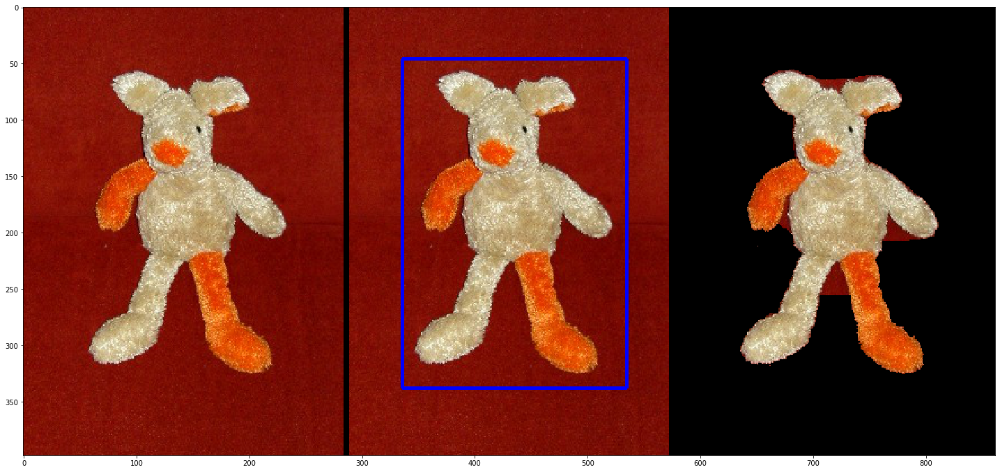

In [9]:
I=cv.imread('report/output/teddy_output.png')
plt.figure(figsize=(25,25))
plt.imshow(cv.cvtColor(I, cv.COLOR_BGR2RGB))
plt.show()

#### Using 5 iterations

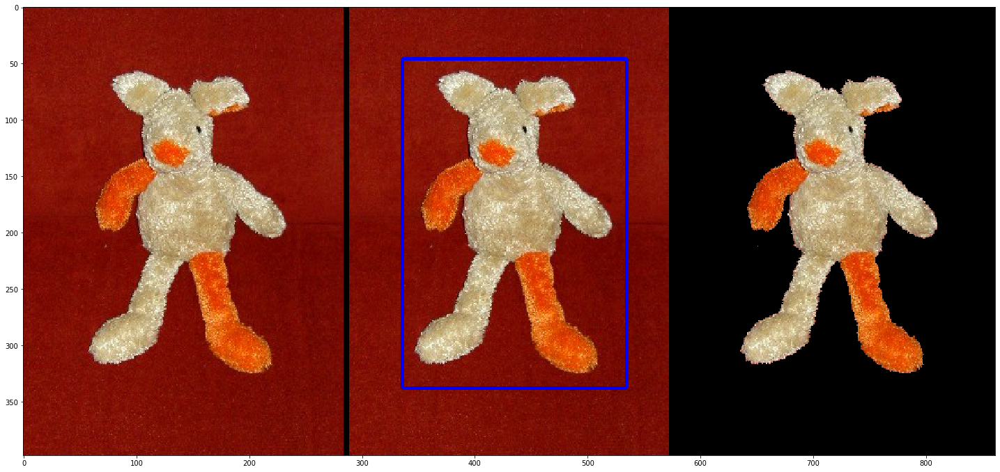

In [10]:
I=cv.imread('report/output_itr5/teddy_output_itr5.png')
plt.figure(figsize=(25,25))
plt.imshow(cv.cvtColor(I, cv.COLOR_BGR2RGB))
plt.show()

### The number of mixture components in your GMM.
The paper suggests 5 GMM components to be used. Changing the number of components shows bad results for fewer components(tested for 3) and similar results for 5,10 GMM components. The number of components used must be able to capture the information in the foreground/background adequately.

Number of iterations = 1

Gamma = 50

Connectivity = 8

#### 3 components

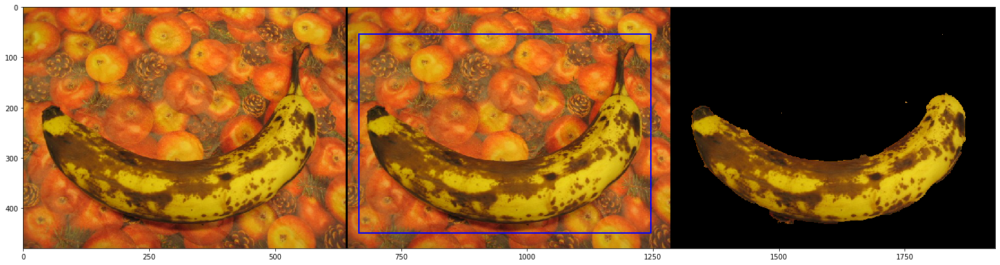

In [11]:
I=cv.imread('report/output_k3/banana2_output_k3.png')
plt.figure(figsize=(25,25))
plt.imshow(cv.cvtColor(I, cv.COLOR_BGR2RGB))
plt.show()

#### 5 components

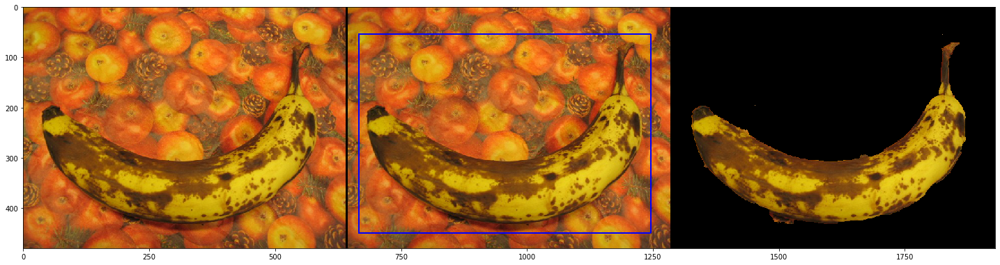

In [12]:
I=cv.imread('report/output/banana2_output.png')
plt.figure(figsize=(25,25))
plt.imshow(cv.cvtColor(I, cv.COLOR_BGR2RGB))
plt.show()

#### 10 components

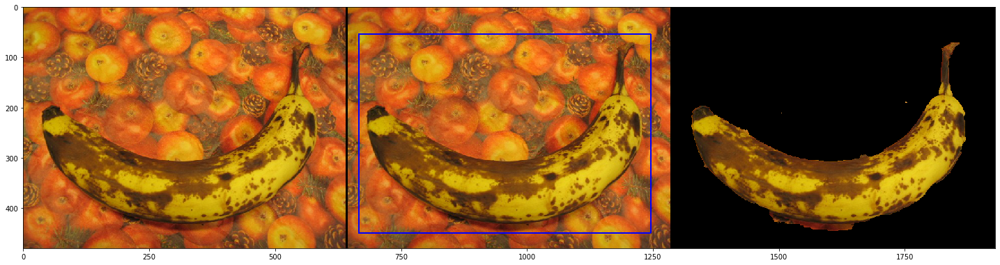

In [13]:
I=cv.imread('report/output_k10/banana2_output_k10.png')
plt.figure(figsize=(25,25))
plt.imshow(cv.cvtColor(I, cv.COLOR_BGR2RGB))
plt.show()

### 4-connectivity or 8-connectivity 
Results by using 8 connectivity are far better than using 4 conectivity as the former includes more information from its neighbours and hence gives smoother, better results.

Number of iterations = 1

Gamma = 50

GMM components = 5

#### 4-connectivity

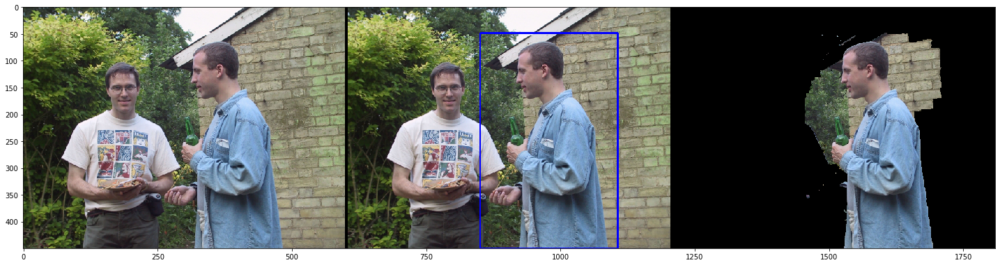

In [14]:
I=cv.imread('report/output_4connec/person4_output_4connec.png')
plt.figure(figsize=(25,25))
plt.imshow(cv.cvtColor(I, cv.COLOR_BGR2RGB))
plt.show()

#### 8-connectivity

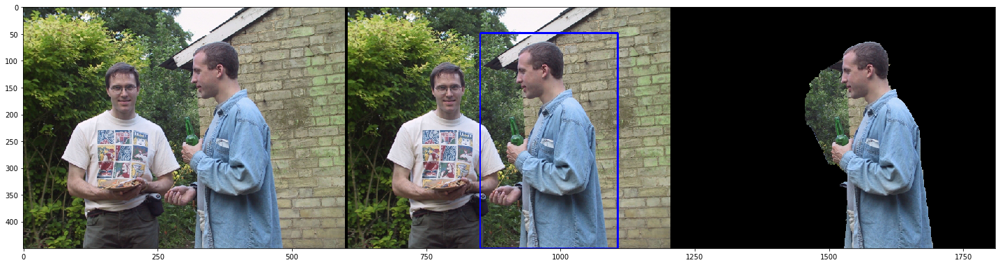

In [15]:
I=cv.imread('report/output/person4_output.png')
plt.figure(figsize=(25,25))
plt.imshow(cv.cvtColor(I, cv.COLOR_BGR2RGB))
plt.show()

### Gamma Value
According to the paper the gamma value determines the weight to be given to the smoothness term V while calculating the total energy. Lower values of gamma relate to more smoothness and hence a lot of background region being wrongly identified as foreground, but increasing it a lot can lead to some parts of foreground being left out. The paper suggests an optimal value of 50 found to work the best from experiments.

Number of iterations = 1

Connectivity = 8

GMM components = 5

#### Gamma 10

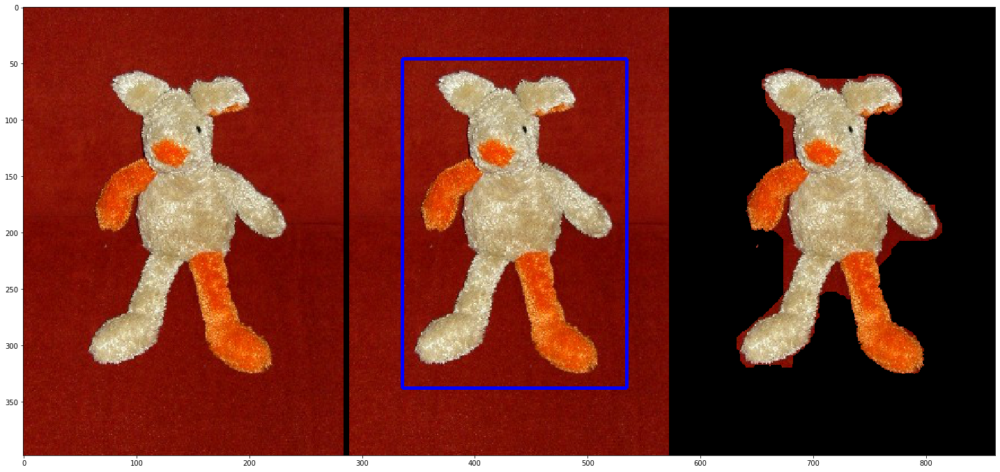

In [16]:
I=cv.imread('report/output_gamma10/teddy_output_gamma10.png')
plt.figure(figsize=(25,25))
plt.imshow(cv.cvtColor(I, cv.COLOR_BGR2RGB))
plt.show()

#### Gamma 50

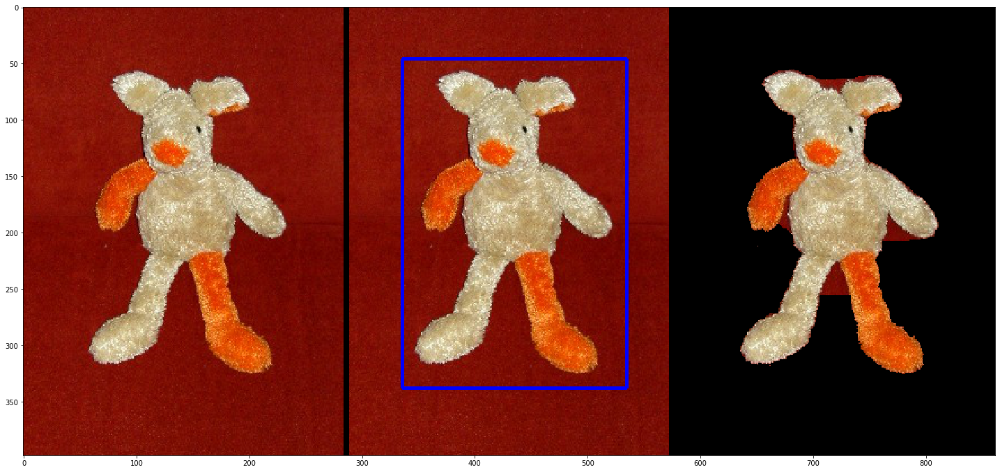

In [17]:
I=cv.imread('report/output/teddy_output.png')
plt.figure(figsize=(25,25))
plt.imshow(cv.cvtColor(I, cv.COLOR_BGR2RGB))
plt.show()

#### Gamma 100

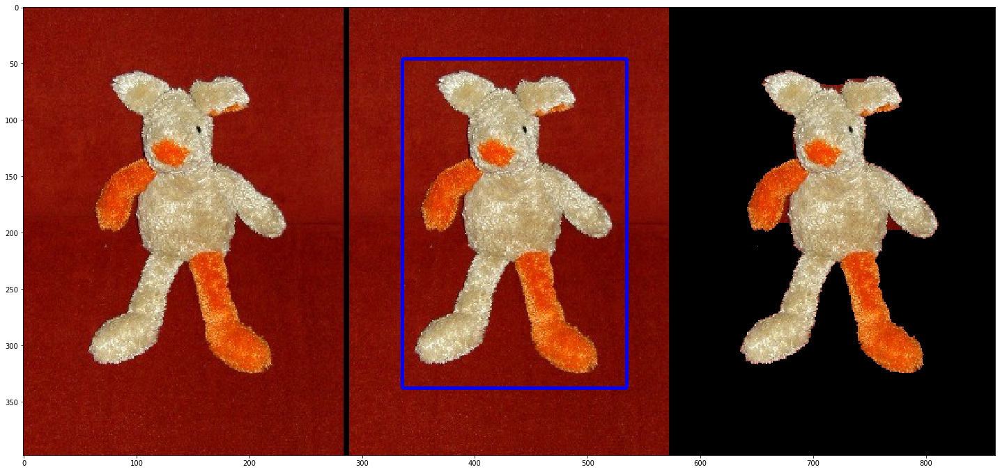

In [18]:
I=cv.imread('report/output_gamma100/teddy_output_gamma100.png')
plt.figure(figsize=(25,25))
plt.imshow(cv.cvtColor(I, cv.COLOR_BGR2RGB))
plt.show()

### Different Colour Spaces
Apart from RGB, HSV, LAB and YcrCb colour spaces were used for segmentation giving varying results on different images.

Connectivity = 8

Number of iterations = 1

Gamma = 50

GMM components = 5

#### RGB

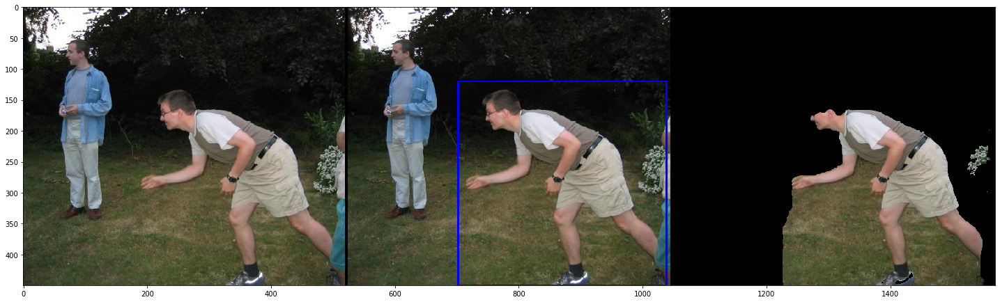

In [19]:
I=cv.imread('report/output/bool_output.png')
plt.figure(figsize=(25,25))
plt.imshow(cv.cvtColor(I, cv.COLOR_BGR2RGB))
plt.show()

#### HSV

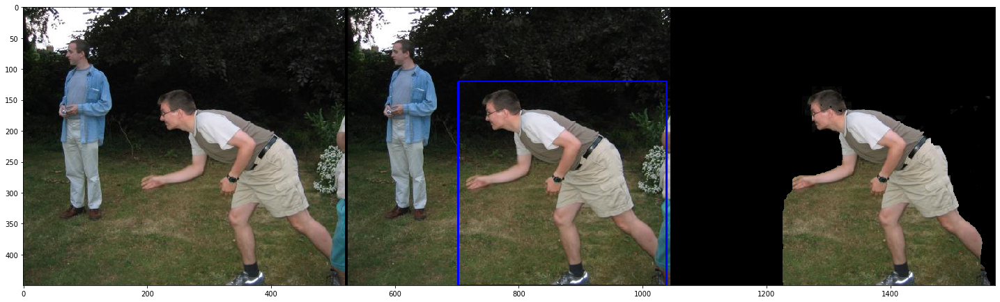

In [20]:
I=cv.imread('report/output_hsv/bool_output_hsv.png')
plt.figure(figsize=(25,25))
plt.imshow(cv.cvtColor(I, cv.COLOR_BGR2RGB))
plt.show()

#### LAB

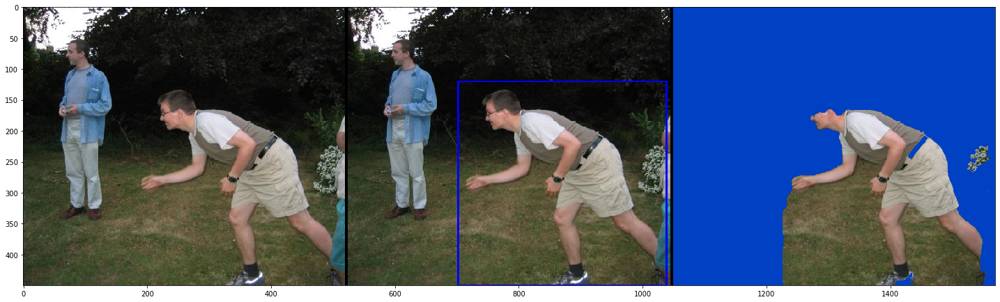

In [21]:
I=cv.imread('report/output_lab/bool_output_lab.png')
plt.figure(figsize=(25,25))
plt.imshow(cv.cvtColor(I, cv.COLOR_BGR2RGB))
plt.show()

#### YCrCb

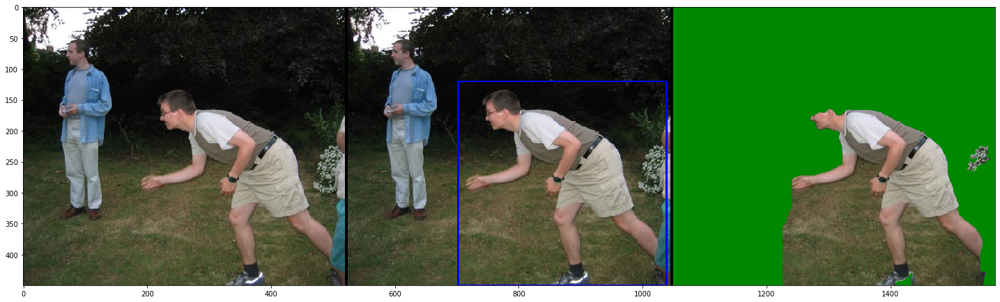

In [22]:
I=cv.imread('report/output_ycrcb/bool_output_ycrcb.png')
plt.figure(figsize=(25,25))
plt.imshow(cv.cvtColor(I, cv.COLOR_BGR2RGB))
plt.show()

### Different bounding boxes
By using a tight initial bounding box, we given a better fit for the probable foreground and thus improving segmentation result as compared to a loose bounding box.

Number of iterations = 1

GMM components = 5

Gamma = 50

Connectivity = 8

#### Tight Bounding Box

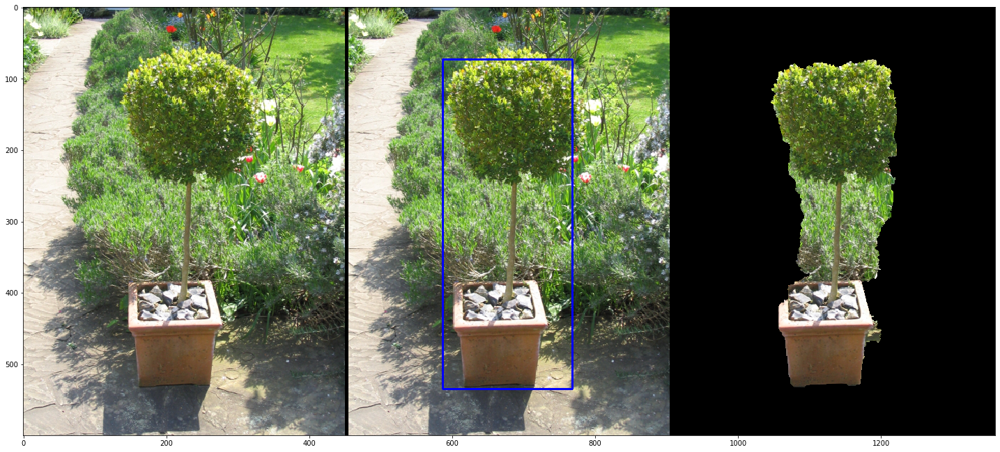

In [23]:
I=cv.imread('report/output_diffbbox/bush_smallbboxoutput.png')
plt.figure(figsize=(25,25))
plt.imshow(cv.cvtColor(I, cv.COLOR_BGR2RGB))
plt.show()

#### Loose Bounding Box

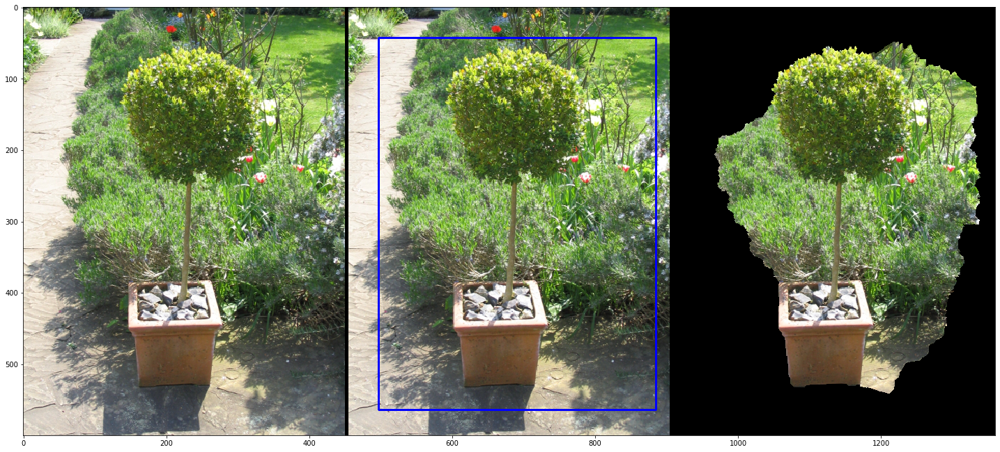

In [24]:
I=cv.imread('report/output_diffbbox/bush_largebboxoutput.png')
plt.figure(figsize=(25,25))
plt.imshow(cv.cvtColor(I, cv.COLOR_BGR2RGB))
plt.show()